In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
import keras
from keras.layers import Dense
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Conv2D, MaxPool2D, Dropout, Flatten
from sklearn.utils import shuffle
import cv2
from sklearn.model_selection import train_test_split
import pandas as pd
import ntpath
import random
import matplotlib.image as mpimg
from imgaug import augmenters as iaa

2024-09-03 00:00:18.470442: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-09-03 00:00:18.923577: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-09-03 00:00:19.090814: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-03 00:00:20.377556: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

In [3]:
!pwd

/home/proxi/projects/udemyAV


In [4]:
datadir = 'data'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,/home/proxi/projects/udemyAV/data/IMG/center_2...,/home/proxi/projects/udemyAV/data/IMG/left_20...,/home/proxi/projects/udemyAV/data/IMG/right_2...,0.0,0.0,0.0,0.989862
1,/home/proxi/projects/udemyAV/data/IMG/center_2...,/home/proxi/projects/udemyAV/data/IMG/left_20...,/home/proxi/projects/udemyAV/data/IMG/right_2...,0.0,0.0,0.0,0.978990
2,/home/proxi/projects/udemyAV/data/IMG/center_2...,/home/proxi/projects/udemyAV/data/IMG/left_20...,/home/proxi/projects/udemyAV/data/IMG/right_2...,0.0,0.0,0.0,0.966089
3,/home/proxi/projects/udemyAV/data/IMG/center_2...,/home/proxi/projects/udemyAV/data/IMG/left_20...,/home/proxi/projects/udemyAV/data/IMG/right_2...,0.0,0.0,0.0,0.955458
4,/home/proxi/projects/udemyAV/data/IMG/center_2...,/home/proxi/projects/udemyAV/data/IMG/left_20...,/home/proxi/projects/udemyAV/data/IMG/right_2...,0.0,0.0,0.0,0.944935


#### path_leaf function for reducing the path length

In [5]:
def path_left(path):
    head, tail = ntpath.split(path)
    return tail

data['center'] = data['center'].apply(path_left)
data['left'] = data['left'].apply(path_left)
data['right'] = data['right'].apply(path_left)

data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2024_08_27_01_43_16_241.jpg,left_2024_08_27_01_43_16_241.jpg,right_2024_08_27_01_43_16_241.jpg,0.0,0.0,0.0,0.989862
1,center_2024_08_27_01_43_16_347.jpg,left_2024_08_27_01_43_16_347.jpg,right_2024_08_27_01_43_16_347.jpg,0.0,0.0,0.0,0.978990
2,center_2024_08_27_01_43_16_458.jpg,left_2024_08_27_01_43_16_458.jpg,right_2024_08_27_01_43_16_458.jpg,0.0,0.0,0.0,0.966089
3,center_2024_08_27_01_43_16_570.jpg,left_2024_08_27_01_43_16_570.jpg,right_2024_08_27_01_43_16_570.jpg,0.0,0.0,0.0,0.955458
4,center_2024_08_27_01_43_16_672.jpg,left_2024_08_27_01_43_16_672.jpg,right_2024_08_27_01_43_16_672.jpg,0.0,0.0,0.0,0.944935


### Visualize the data

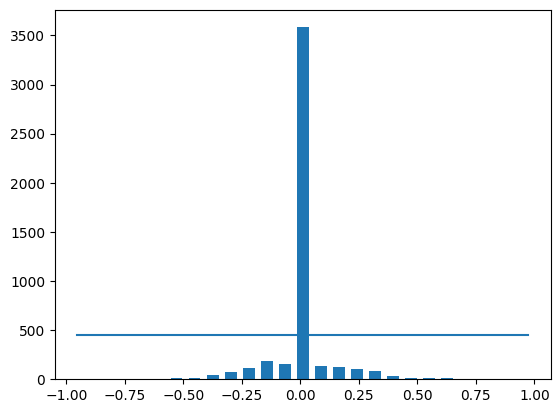

In [6]:
num_bin = 25 # It determines how many segments the data will be divided into.
samples_per_bin = 450
hist, bins = np.histogram(data['steering'], num_bin)
center = (bins[:-1] + bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [8]:
print('total data:', len(data))  # Print total number of data points
remove_list = []

for j in range(num_bin):
    list_ = []
    for i in range(len(data['steering'])):
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[samples_per_bin:]  # Keep only up to samples_per_bin
    remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)  # Remove excess data points
print('Remaining data:', len(data))

hist_ = np.histogram(data['steering'], bins=num_bin)
center = (bins[:-1] + bins[1:]) / 2  # Calculate bin centers

plt.bar(center, hist_[0], width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))  # Threshold line
plt.show()  # Display the plot


total data: 4734


AttributeError: 'list' object has no attribute 'shape'

In [ ]:
def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(data)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data.iloc[0], indexed_data.iloc[1], indexed_data.iloc[2]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data.iloc[3]))
    image_path = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_path, steerings


image_path, steerings = load_img_steering(datadir + '/IMG', data)
print(data.iloc[1])


center      center_2024_08_27_01_43_18_282.jpg
left          left_2024_08_27_01_43_18_282.jpg
right        right_2024_08_27_01_43_18_282.jpg
steering                              0.188712
throttle                                   1.0
reverse                                    0.0
speed                                  12.7891
Name: 19, dtype: object


# Test train split

In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(image_path, steerings, test_size=0.2, random_state=42)
print("Training Samples: {}\nValid Samples: {}".format(len(X_train), len(X_valid)))


Training Samples: 1280
Valid Samples: 321


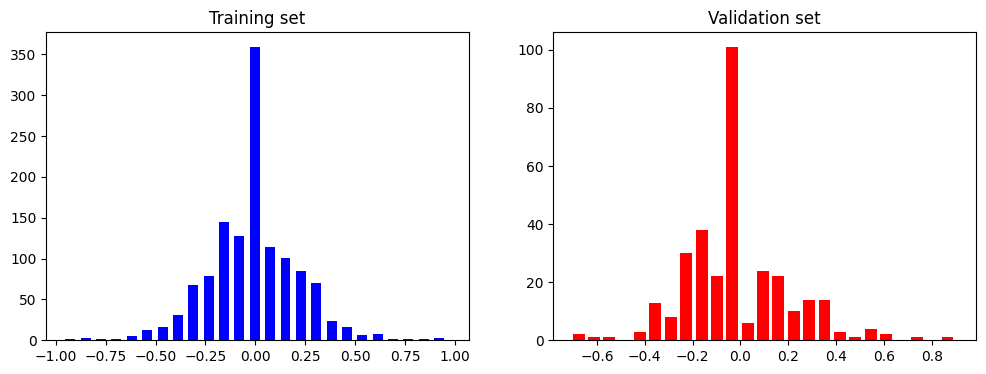

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))  # Note the change to plt.subplots()
axes[0].hist(y_train, bins=num_bin, width=0.05, color='blue')
axes[0].set_title("Training set")
axes[1].hist(y_valid, bins=num_bin, width=0.05, color='red')
axes[1].set_title("Validation set")
plt.show()


# Augmentation

### ZOOM

In [ ]:
def zoom(image):
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image

Text(0.5, 1.0, 'zoomed_image')

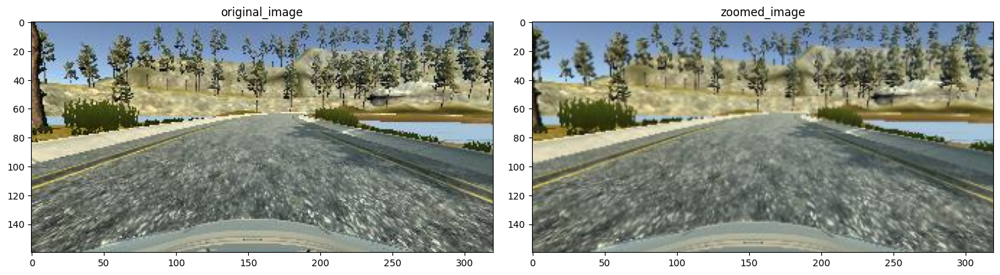

In [ ]:
image = image_path[random.randint(0,1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize = (15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('original_image')

axs[1].imshow(zoomed_image)
axs[1].set_title('zoomed_image')



### Panning (black borders over sides)

In [ ]:
def pan(image):
    pan = iaa.Affine(translate_percent={"x": (-0.1, 0.1), "y": (-0.1, 0.1)})
    image = pan.augment_image(image)
    return image

Text(0.5, 1.0, 'panned_image')

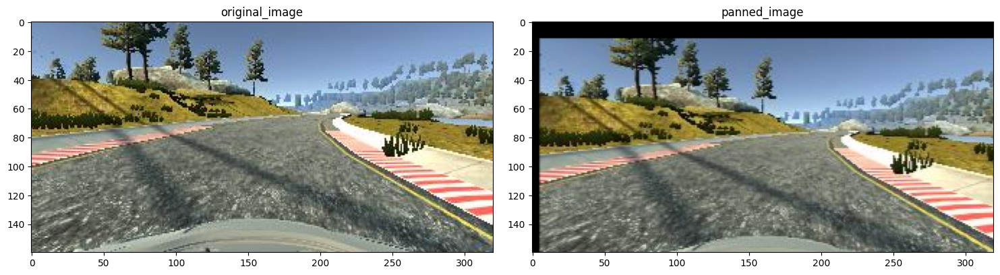

In [ ]:
image = image_path[random.randint(0,1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize = (15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('original_image')

axs[1].imshow(panned_image)
axs[1].set_title('panned_image')

### Brightness

In [ ]:
def image_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

Text(0.5, 1.0, 'image_random_brightness')

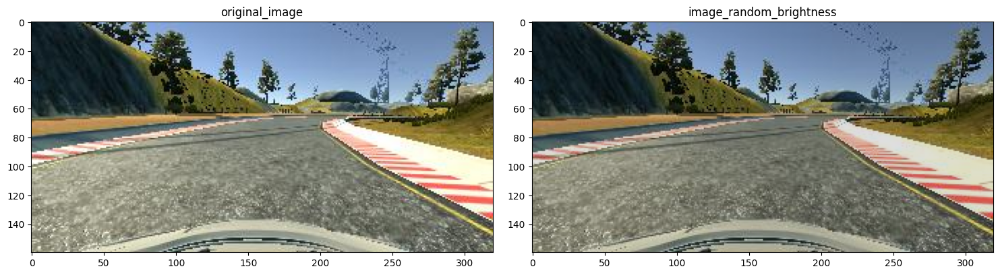

In [ ]:
image = image_path[random.randint(0,1000)]
original_image = mpimg.imread(image)
brightness_altered_image = image_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize = (15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('original_image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('image_random_brightness')

### Flipping

In [ ]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image, 1)
    steering_angle = -steering_angle
    return image, steering_angle

Text(0.5, 1.0, 'Flipped Image - Steering Angle:-0.1435976')

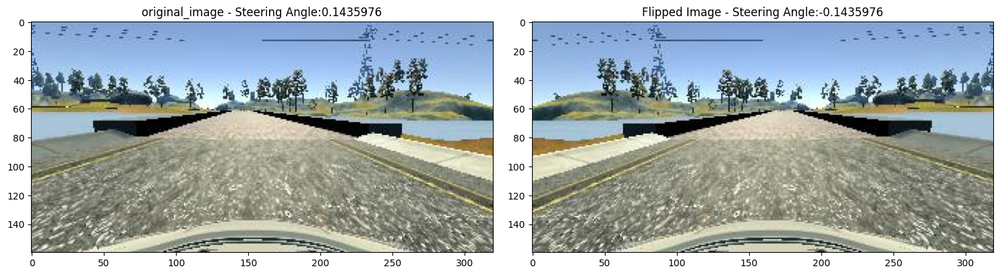

In [ ]:
random_index = random.randint(0, 1000)
image = image_path[random.randint(0,1000)]
steering_angle = steerings[random_index]

original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize = (15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('original_image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [ ]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = image_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)
    return image, steering_angle
    


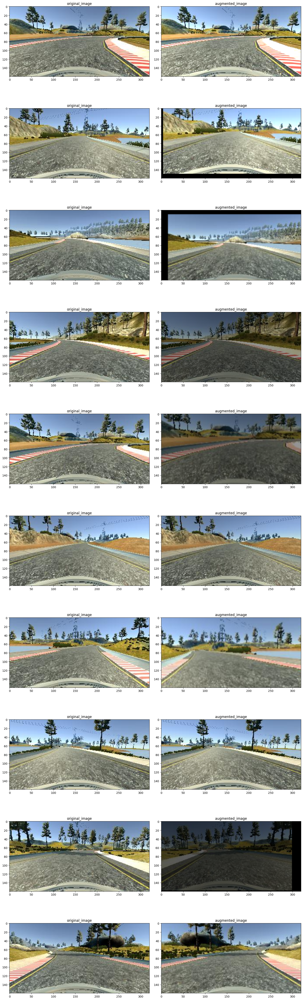

In [ ]:
ncol = 2
nrow = 10
fig, axs = plt.subplots(nrow, ncol, figsize = (15, 50))
fig.tight_layout()

for i in range(10):
    randnum = random.randint(0, len(image_path) - 1)
    random_image = image_path[randnum]
    random_steering = steerings[randnum]

    original_image = mpimg.imread(random_image)
    augmented_image, steering_angle = random_augment(random_image, random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title('original_image')

    axs[i][1].imshow(augmented_image) 
    axs[i][1].set_title('augmented_image')


## Preprocessing data

In [ ]:
def img_preprocessing(img):# This will read the iamge
    img = img[60:135, :,: ]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img / 255
    return img 
    

Text(0.5, 1.0, 'Preprocessed Image')

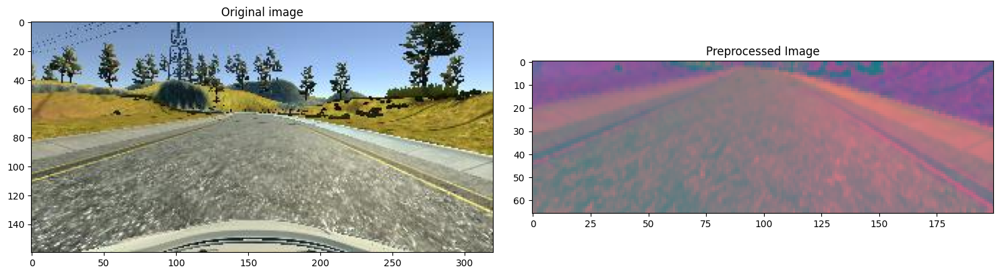

In [ ]:
image = image_path[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocessing(original_image)

fig, axes = plt.subplots(1, 2, figsize = (15, 10))
fig.tight_layout()
axes[0].imshow(original_image)
axes[0].set_title('Original image')
axes[1].imshow(preprocessed_image)
axes[1].set_title('Preprocessed Image')



In [ ]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
  
  while True:
    batch_img = []
    batch_steering = []
    
    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)
      
      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
     
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]
      
      im = img_preprocessing(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))  

Text(0.5, 1.0, 'Validation Image')

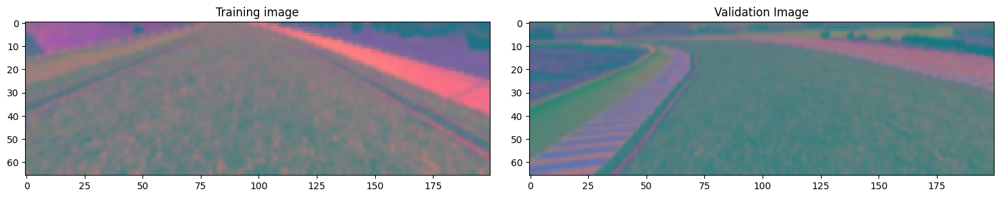

In [ ]:
X_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
X_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 1))

fig, axes = plt.subplots(1, 2, figsize = (15, 10))
fig.tight_layout()

axes[0].imshow(X_train_gen[0])
axes[0].set_title('Training image')

axes[1].imshow(X_valid_gen[0])
axes[1].set_title('Validation Image')


# Nvidia Model

In [ ]:
def nvidia_model():
    model = Sequential()
    model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(64, (3, 3), activation='elu'))
    model.add(Conv2D(64, (3, 3), activation='elu'))
    # model.add(Dropout(0.5))

    model.add(Flatten())
    model.add(Dense(100, activation='elu'))
    # model.add(Dropout(0.5))

    model.add(Dense(50, activation='elu'))
    model.add(Dense(10, activation='elu'))
    model.add(Dense(1))

    model.compile(loss='mse', optimizer=Adam(learning_rate=0.0001))
    return model

In [ ]:
model = nvidia_model()
model.summary()

2024-08-28 03:02:13.838297: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-08-28 03:02:13.859961: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-08-28 03:02:13.860135: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-08-28 03:02:13.860849: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the approp

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               1

In [ ]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300, 
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

/tmp/ipykernel_76095/1774700600.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10


2024-08-28 03:02:15.150879: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8700
2024-08-28 03:02:15.343036: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


300/300 [==============================] - 73s 240ms/step - loss: 0.0428 - val_loss: 0.0275
Epoch 2/10
300/300 [==============================] - 63s 212ms/step - loss: 0.0361 - val_loss: 0.0268
Epoch 3/10
300/300 [==============================] - 79s 266ms/step - loss: 0.0339 - val_loss: 0.0253
Epoch 4/10
300/300 [==============================] - 80s 268ms/step - loss: 0.0321 - val_loss: 0.0257
Epoch 5/10
300/300 [==============================] - 68s 228ms/step - loss: 0.0291 - val_loss: 0.0217
Epoch 6/10
300/300 [==============================] - 68s 228ms/step - loss: 0.0279 - val_loss: 0.0215
Epoch 7/10
300/300 [==============================] - 67s 225ms/step - loss: 0.0262 - val_loss: 0.0216
Epoch 8/10
300/300 [==============================] - 70s 234ms/step - loss: 0.0252 - val_loss: 0.0229
Epoch 9/10
300/300 [==============================] - 61s 203ms/step - loss: 0.0247 - val_loss: 0.0238
Epoch 10/10
300/300 [==============================] - 61s 205ms/step - loss: 0.0237

Text(0.5, 0, 'EPOCHS')

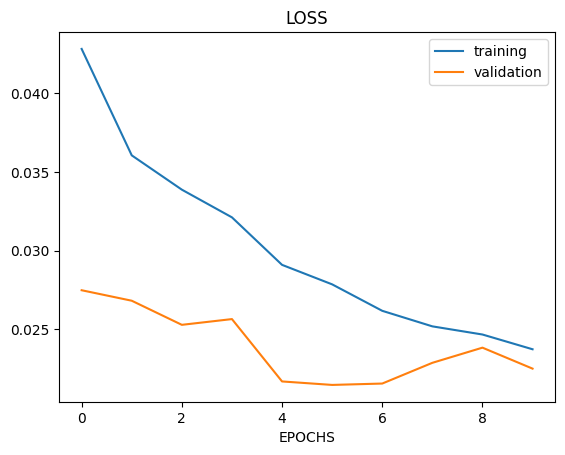

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title("LOSS")
plt.xlabel("EPOCHS")

In [ ]:
model.save('model.h5')